# Project 4 - Term Deposit Sale

##Problem Statement(Term Deposit Sale)

Goal:
    Using the collected from existing customers, build a model that will help the marketing team identity potential customers who are relatively more likely to subscribe term deposit and thus increase their hit ratio.
    
Resources Avaliable:
The historical data for this project is available in file
https://archive.ics.uci.edu/ml/datasets/Bank+Marketing



In [386]:
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

In [387]:
bank_df = pd.read_csv('bank-full.csv')

In [388]:
bank_df.shape

(45211, 17)

# Deliverable-1
(Exploratory data quality report reflecting the following)

1. Univariate analysis
   a. Univariate analysis - data types and description of the independent attributes which should include(name, meaning, range of values observed, central values (mean and median), standard deviation and quantiles, analysis of the body of distributions/tails, missing values, outliers)

In [389]:
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [390]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null int64
job          45211 non-null object
marital      45211 non-null object
education    45211 non-null object
default      45211 non-null object
balance      45211 non-null int64
housing      45211 non-null object
loan         45211 non-null object
contact      45211 non-null object
day          45211 non-null int64
month        45211 non-null object
duration     45211 non-null int64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null object
Target       45211 non-null object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [391]:
bank_df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [392]:
bank_df.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
Target       0
dtype: int64

In [393]:
bank_df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,45211,NaN,NaN,NaN,40.9362,10.6188,18,33,39,48,95
job,45211,12,blue-collar,9732,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,45211,3,married,27214,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,45211,4,secondary,23202,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,45211,2,no,44396,NaN,NaN,NaN,NaN,NaN,NaN,NaN
balance,45211,NaN,NaN,NaN,1362.27,3044.77,-8019,72,448,1428,102127
housing,45211,2,yes,25130,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,45211,2,no,37967,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,45211,3,cellular,29285,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day,45211,NaN,NaN,NaN,15.8064,8.32248,1,8,16,21,31


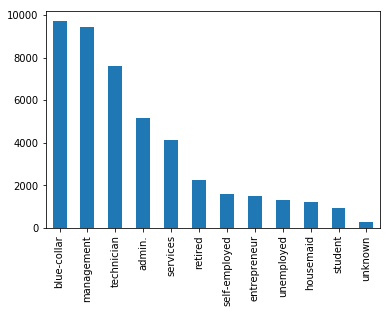

In [394]:
bank_df['job'].value_counts().plot.bar()

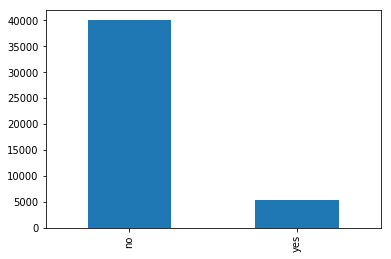

In [395]:
bank_df['Target'].value_counts().plot.bar()

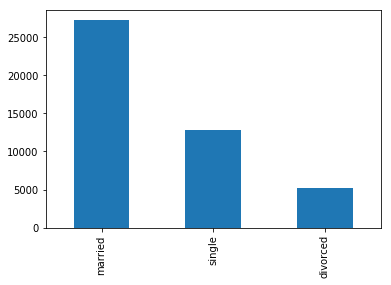

In [396]:
bank_df['marital'].value_counts().plot.bar()

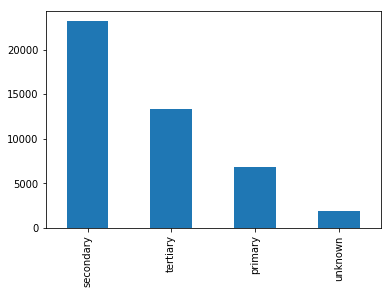

In [397]:
bank_df['education'].value_counts().plot.bar()

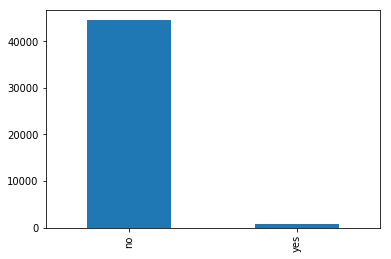

In [398]:
bank_df['default'].value_counts().plot.bar()

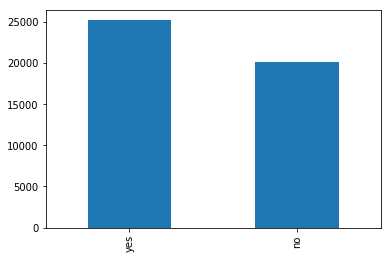

In [399]:
bank_df['housing'].value_counts().plot.bar()

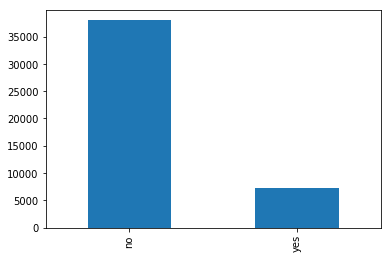

In [400]:
bank_df['loan'].value_counts().plot.bar()

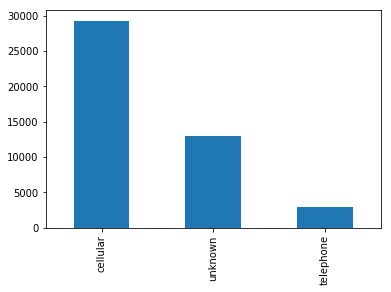

In [401]:
bank_df['contact'].value_counts().plot.bar()

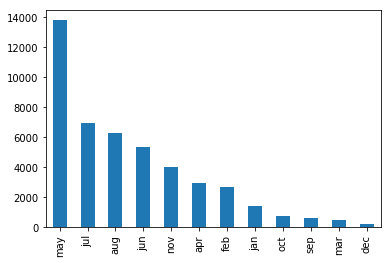

In [402]:
bank_df['month'].value_counts().plot.bar()

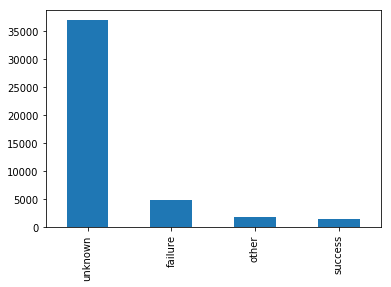

In [403]:
bank_df['poutcome'].value_counts().plot.bar()

In [404]:
bank_df.describe(include=[np.number]).transpose()

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000024D95623048>,
      dtype=object)

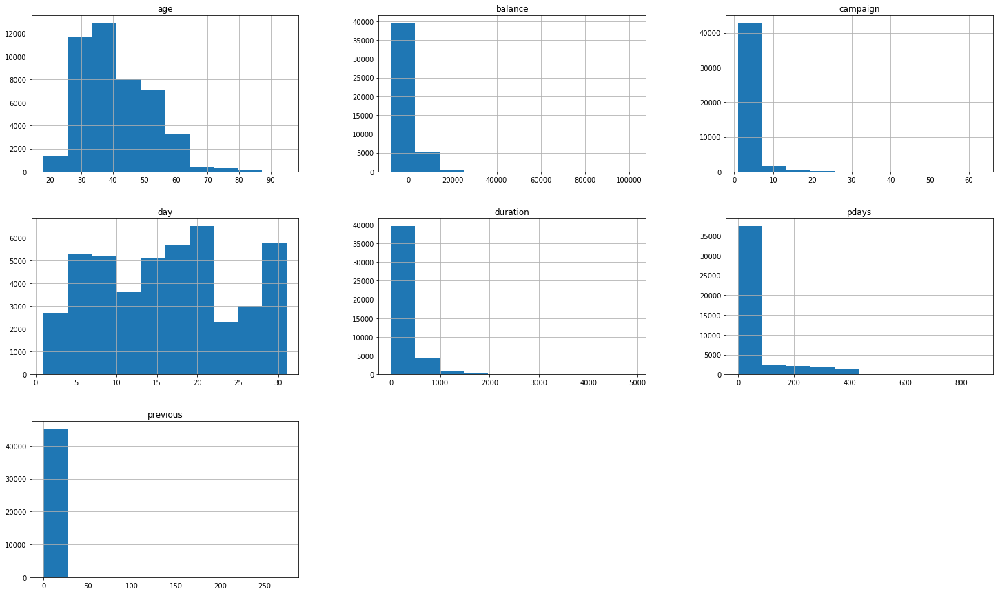

In [405]:
bank_df.hist(figsize=(25,15))

Outlier detection analysis

{'whiskers': [<matplotlib.lines.Line2D at 0x24d959c9ba8>,
 'caps': [<matplotlib.lines.Line2D at 0x24d958e3f60>,
 'boxes': [<matplotlib.lines.Line2D at 0x24d959c9a58>],
 'medians': [<matplotlib.lines.Line2D at 0x24d959ccc88>],
 'fliers': [<matplotlib.lines.Line2D at 0x24d959ce0f0>],
 'means': []}

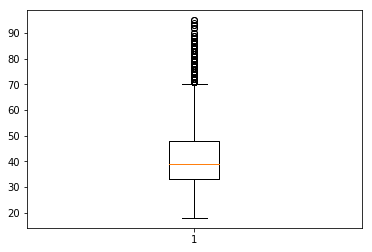

In [406]:
plt.boxplot(bank_df['age'])

{'whiskers': [<matplotlib.lines.Line2D at 0x24d959f3278>,
 'caps': [<matplotlib.lines.Line2D at 0x24d959f3b38>,
 'boxes': [<matplotlib.lines.Line2D at 0x24d959f3128>],
 'medians': [<matplotlib.lines.Line2D at 0x24d959f83c8>],
 'fliers': [<matplotlib.lines.Line2D at 0x24d959f87f0>],
 'means': []}

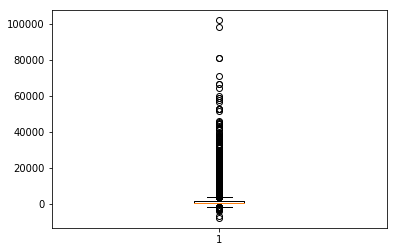

In [407]:
plt.boxplot(bank_df['balance'])

{'whiskers': [<matplotlib.lines.Line2D at 0x24d95a18f28>,
 'caps': [<matplotlib.lines.Line2D at 0x24d95a1e828>,
 'boxes': [<matplotlib.lines.Line2D at 0x24d95a18dd8>],
 'medians': [<matplotlib.lines.Line2D at 0x24d95a240b8>],
 'fliers': [<matplotlib.lines.Line2D at 0x24d95a244e0>],
 'means': []}

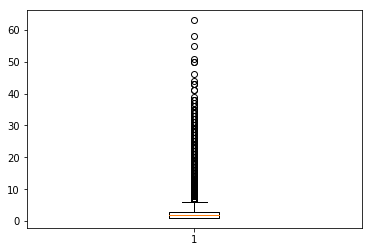

In [408]:
plt.boxplot(bank_df['campaign'])

{'whiskers': [<matplotlib.lines.Line2D at 0x24d95cd97f0>,
 'caps': [<matplotlib.lines.Line2D at 0x24d95cdc0f0>,
 'boxes': [<matplotlib.lines.Line2D at 0x24d95cd96a0>],
 'medians': [<matplotlib.lines.Line2D at 0x24d95cdc940>],
 'fliers': [<matplotlib.lines.Line2D at 0x24d95cdcd68>],
 'means': []}

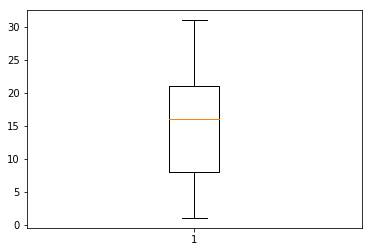

In [409]:
plt.boxplot(bank_df['day'])

{'whiskers': [<matplotlib.lines.Line2D at 0x24d95d1a7f0>,
 'caps': [<matplotlib.lines.Line2D at 0x24d95d240f0>,
 'boxes': [<matplotlib.lines.Line2D at 0x24d95d1a6a0>],
 'medians': [<matplotlib.lines.Line2D at 0x24d95d24940>],
 'fliers': [<matplotlib.lines.Line2D at 0x24d95d24d68>],
 'means': []}

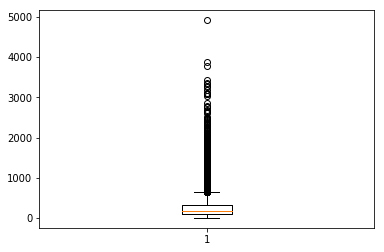

In [410]:
plt.boxplot(bank_df['duration'])

As part of the EDA Analysis we can see more variations in the balance and age, duaration, days columns which is having outlier data and its has to be cleaned

2. Multivariate analysis
   a. Bi-variate analysis between the predictor variables and between the predictor variables and target column. Comment on your findings in terms of their relationship and degree of relation if any. Presence of leverage points. Visualllize the analysis using boxplots and pair plots, histograms or density curves. Select the most appropriate attributes

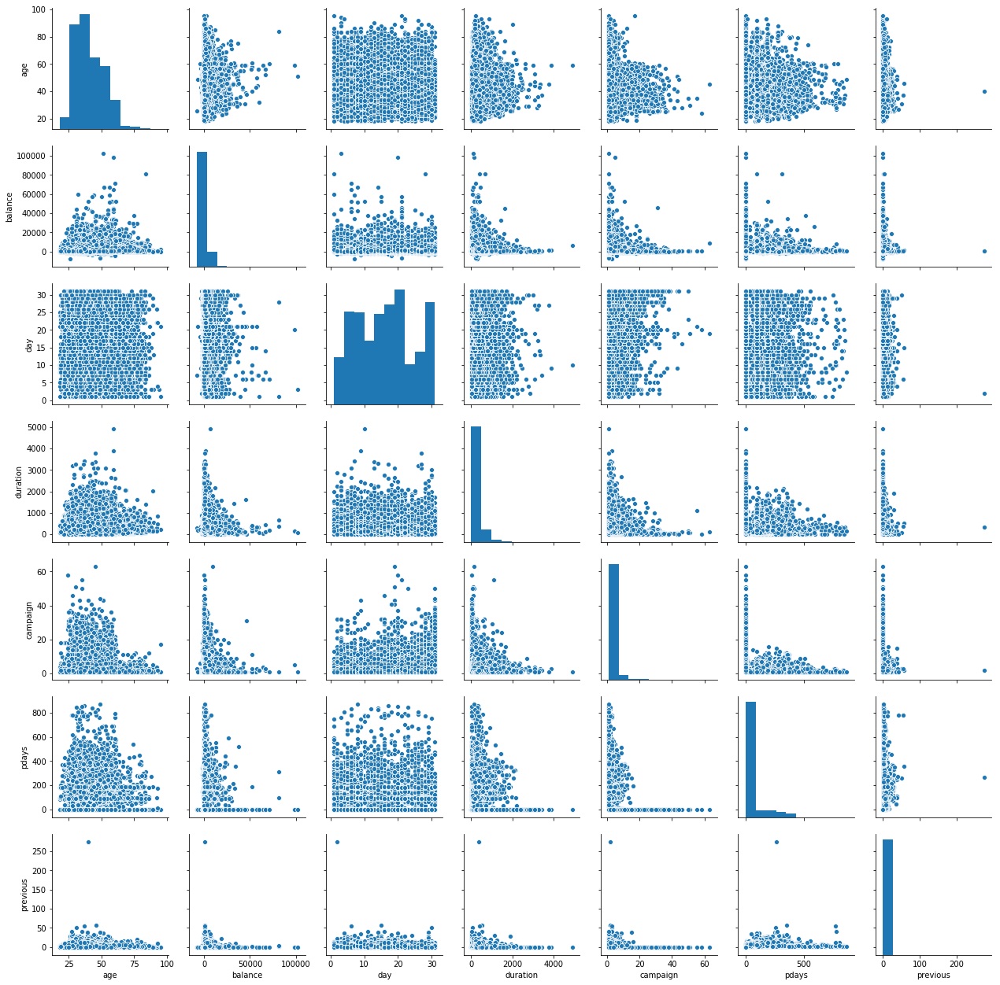

In [411]:
sns.pairplot(bank_df)

As per the pair plot we can see there are multiple numeric columns data is more squead towards 0 and we will be applying normalization or scalling the data.

3. Strategies to address the different data challenges such as data pollution, outliers and missing values.

In [412]:
corr = bank_df.corr()
corr


,age,balance,day,duration,campaign,pdays,previous
age,1.000000,0.097783,-0.009120,-0.004648,0.004760,-0.023758,0.001288
balance,0.097783,1.000000,0.004503,0.021560,-0.014578,0.003435,0.016674
day,-0.009120,0.004503,1.000000,-0.030206,0.162490,-0.093044,-0.051710
duration,-0.004648,0.021560,-0.030206,1.000000,-0.084570,-0.001565,0.001203
campaign,0.004760,-0.014578,0.162490,-0.084570,1.000000,-0.088628,-0.032855
pdays,-0.023758,0.003435,-0.093044,-0.001565,-0.088628,1.000000,0.454820
previous,0.001288,0.016674,-0.051710,0.001203,-0.032855,0.454820,1.000000


In [413]:
#handling outlier data
Q1 = bank_df.quantile(0.25)
Q3 = bank_df.quantile(0.75)
IQR = Q3 - Q1

print(IQR)
V = 1.5 * IQR

age           15.0
balance     1356.0
day           13.0
duration     216.0
campaign       2.0
pdays          0.0
previous       0.0
dtype: float64


In [414]:
bank_df.shape

(45211, 17)

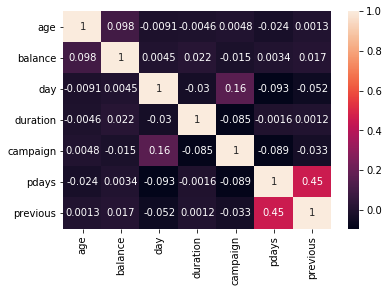

In [415]:
sns.heatmap(corr,annot=True)

As pre the correlation plot we can see that pdays and previous , campaign and day features are having more correlation compare to other variables.

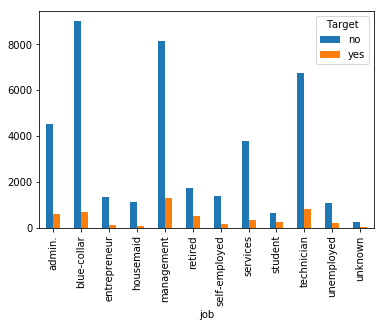

In [416]:
#bnk_data = pd.crosstab(index = (bank_df['job']), columns='count')
bnk_data = pd.crosstab(index=bank_df['job'], columns=bank_df['Target'])
bnk_data.plot.bar()

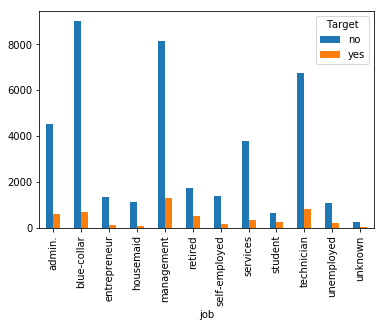

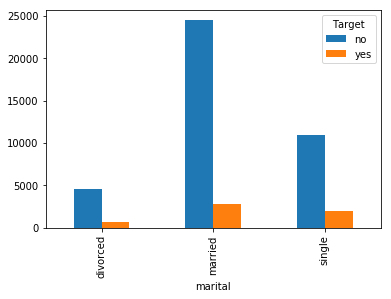

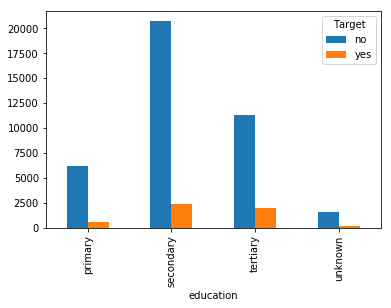

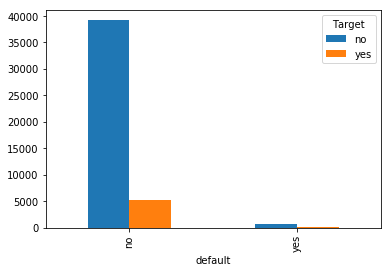

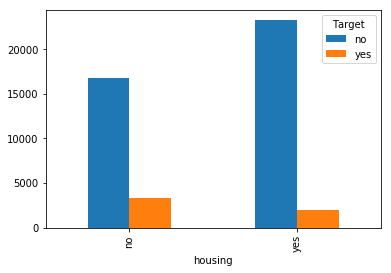

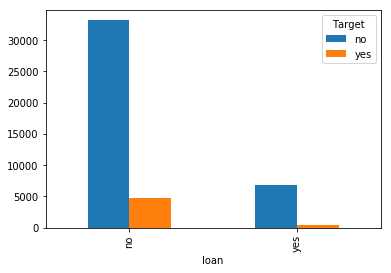

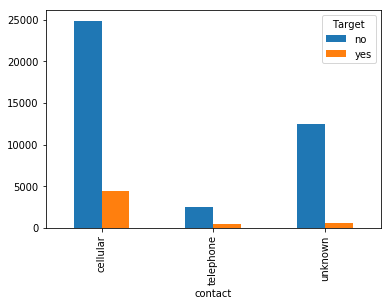

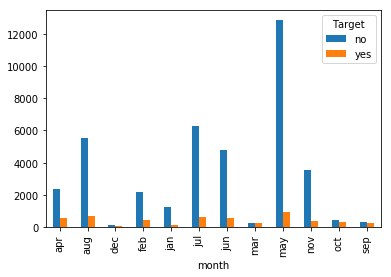

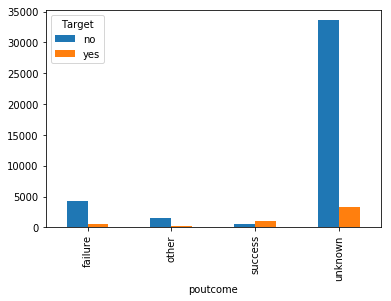

In [417]:
col_list = ['job','marital','education','default','housing','loan','contact','month','poutcome']

for x in col_list:
    bnk_data = pd.crosstab(index=bank_df[x], columns=bank_df['Target'])
    bnk_data.plot.bar()
    #print(x)

# Deliverable - 2 
(Prepare the data for analytics)

1. Load the data into a data-frame. The data-frame should have data and column description

In [418]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null int64
job          45211 non-null object
marital      45211 non-null object
education    45211 non-null object
default      45211 non-null object
balance      45211 non-null int64
housing      45211 non-null object
loan         45211 non-null object
contact      45211 non-null object
day          45211 non-null int64
month        45211 non-null object
duration     45211 non-null int64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null object
Target       45211 non-null object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [419]:
#copying data frame
df = bank_df

In [420]:
df.shape

(45211, 17)

In [421]:
df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,45211,NaN,NaN,NaN,40.9362,10.6188,18,33,39,48,95
job,45211,12,blue-collar,9732,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,45211,3,married,27214,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,45211,4,secondary,23202,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,45211,2,no,44396,NaN,NaN,NaN,NaN,NaN,NaN,NaN
balance,45211,NaN,NaN,NaN,1362.27,3044.77,-8019,72,448,1428,102127
housing,45211,2,yes,25130,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,45211,2,no,37967,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,45211,3,cellular,29285,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day,45211,NaN,NaN,NaN,15.8064,8.32248,1,8,16,21,31


In [422]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null int64
job          45211 non-null object
marital      45211 non-null object
education    45211 non-null object
default      45211 non-null object
balance      45211 non-null int64
housing      45211 non-null object
loan         45211 non-null object
contact      45211 non-null object
day          45211 non-null int64
month        45211 non-null object
duration     45211 non-null int64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null object
Target       45211 non-null object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


2. Ensure the attribute type are correct. If not, take appropriate actions

In [423]:
df.info()# Decision tree in Python can take only numerical / categorical colums. It cannot take string / obeject types. 
# The following code loops through each column and checks if the column type is object then converts those columns
# into categorical with each distinct value becoming a category or code.

for feature in df.columns: # Loop through all columns in the dataframe
    if df[feature].dtype == 'object': # Only apply for columns with categorical strings
        df[feature] = pd.Categorical(df[feature]).codes # Replace strings with an integer

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null int64
job          45211 non-null object
marital      45211 non-null object
education    45211 non-null object
default      45211 non-null object
balance      45211 non-null int64
housing      45211 non-null object
loan         45211 non-null object
contact      45211 non-null object
day          45211 non-null int64
month        45211 non-null object
duration     45211 non-null int64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null object
Target       45211 non-null object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [424]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null int64
job          45211 non-null int8
marital      45211 non-null int8
education    45211 non-null int8
default      45211 non-null int8
balance      45211 non-null int64
housing      45211 non-null int8
loan         45211 non-null int8
contact      45211 non-null int8
day          45211 non-null int64
month        45211 non-null int8
duration     45211 non-null int64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null int8
Target       45211 non-null int8
dtypes: int64(7), int8(10)
memory usage: 2.8 MB


3. Transform the data i.e. scale / normalize if required

In [425]:
df.loc[df['balance']<0,['balance']] = 0

In [426]:
from sklearn.preprocessing import minmax_scale

df['balance'] = minmax_scale(df['balance'])
df['day'] = minmax_scale(df['day'])
df['duration'] = minmax_scale(df['duration'])
df['campaign'] = minmax_scale(df['campaign'])
df['pdays'] = minmax_scale(df['pdays'])
df['previous'] = minmax_scale(df['previous'])


In [427]:
# plot both together to compare
#fig, ax=plt.subplots(1,2)
#sns.distplot(bank_df['balance'], ax=ax[0])
#ax[0].set_title("Original Data")
#sns.distplot(bank_df['balance_sc'], ax=ax[1])
#ax[1].set_title("Scaled data")
#plt.show()

In [428]:
df[df['balance']<0]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


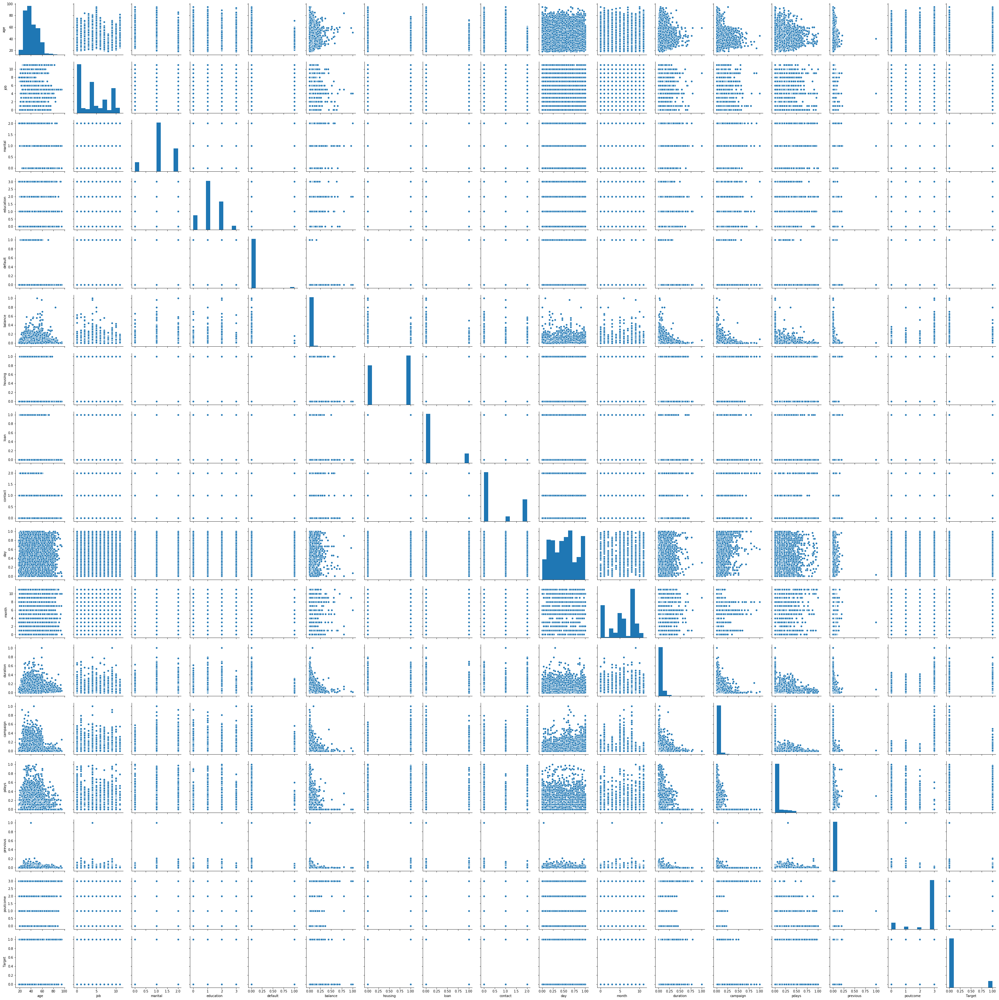

In [429]:
sns.pairplot(df)

4. create the training set and test set in ratio of 70:30

In [430]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null int64
job          45211 non-null int8
marital      45211 non-null int8
education    45211 non-null int8
default      45211 non-null int8
balance      45211 non-null float64
housing      45211 non-null int8
loan         45211 non-null int8
contact      45211 non-null int8
day          45211 non-null float64
month        45211 non-null int8
duration     45211 non-null float64
campaign     45211 non-null float64
pdays        45211 non-null float64
previous     45211 non-null float64
poutcome     45211 non-null int8
Target       45211 non-null int8
dtypes: float64(6), int64(1), int8(10)
memory usage: 2.8 MB


In [431]:
from sklearn.model_selection import train_test_split

In [432]:
X = df.drop('Target', axis=1)
y = df[['Target']]

# split data into train and test/validation sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(31647, 16)
(31647, 1)
(13564, 16)
(13564, 1)


In [433]:
y_train['Target'].value_counts()

0    27955
1     3692
Name: Target, dtype: int64

In [434]:
y_test['Target'].value_counts()

0    11967
1     1597
Name: Target, dtype: int64

# Delivrable - 3
(create the ensemble model)

build models to predict the variable is_attributed (downloaded). We'll try the several variants of boosting (adaboost, gradient boosting and XGBoost), tune the hyperparameters in each model and choose the one which gives the best performance.
In the original Kaggle competition, the metric for model evaluation is area under the ROC curve.

1. Write python code using scikitelern, pandas, numpy and other in jupyter notebook to train and test the ensemble model
2. First Create a model using standard classification algorithm, Note the model performance
3. Use appropriate algorithm's and explain why that algorithm in the comment lines

In [435]:
from sklearn.tree import DecisionTreeClassifier

In [436]:
dt_model = DecisionTreeClassifier(criterion = 'entropy' )

In [437]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31647 entries, 26988 to 17931
Data columns (total 16 columns):
age          31647 non-null int64
job          31647 non-null int8
marital      31647 non-null int8
education    31647 non-null int8
default      31647 non-null int8
balance      31647 non-null float64
housing      31647 non-null int8
loan         31647 non-null int8
contact      31647 non-null int8
day          31647 non-null float64
month        31647 non-null int8
duration     31647 non-null float64
campaign     31647 non-null float64
pdays        31647 non-null float64
previous     31647 non-null float64
poutcome     31647 non-null int8
dtypes: float64(6), int64(1), int8(9)
memory usage: 2.2 MB


In [438]:
dt_model.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [439]:
train_char_label = ['No', 'Yes']

In [440]:
from IPython.display import Image  
#import pydotplus as pydot
from sklearn import tree
from os import system

#Bank_Tree_File = open('D:\DW\PGP_AI_ML\Ensemble\Project\bank_tree.dot','w')
#dot_data = tree.export_graphviz(dt_model, out_file=Bank_Tree_File, feature_names = list(X_train), class_names = list(train_char_label))

#Credit_Tree_File.close()


# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))


                Imp
age        0.097795
job        0.042502
marital    0.016674
education  0.021516
default    0.001916
balance    0.093447
housing    0.030158
loan       0.006988
contact    0.039309
day        0.082288
month      0.093781
duration   0.309184
campaign   0.032027
pdays      0.075960
previous   0.010784
poutcome   0.045671


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.315301 to fit



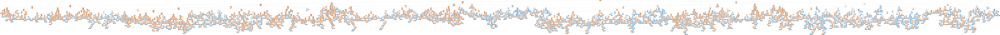

In [441]:
#https://medium.com/@rnbrown/creating-and-visualizing-decision-trees-with-python-f8e8fa394176
#https://stackoverflow.com/questions/36979421/how-can-i-use-conda-to-install-pydotplus

from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()

export_graphviz(dt_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [442]:
y_predict = dt_model.predict(X_test)

In [443]:
# calculate accuracy measures and confusion matrix
from sklearn import metrics

In [444]:
print(dt_model.score(X_train , y_train))
print(dt_model.score(X_test , y_test))

1.0
0.8781332940135653


4. Evaluate the model. Use confusion matrix to evaluate class level metrics. i.e Precision and recall. Also reflect the overall score of the model.

In [445]:
print(metrics.confusion_matrix(y_test, y_predict))

[[11123   844]
 [  809   788]]


In [446]:
#Recall
print(777/(777+820))

#Pression
print(777/(777+857))

#As per this analysis pression and Recall looks so same.

0.4865372573575454
0.4755201958384333


5. Advantages and disadvantages of the algorithm

Advantages
* We can group the models together for prediction both in classification and regression model
*

Disadvantages
* It will overfit and proven to various errors
* If we build using ensemble method it will become block box very difficult to interpretable



6. Build the ensemble models and compare the result with the base model. Note Random forest can be used only with decision Tree

Ensemble Learning - Bagging


In [447]:
from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(base_estimator=dt_model, n_estimators=50)

#bgcl = BaggingClassifier(n_estimators=50)
bgcl = bgcl.fit(X_train, y_train)

In [448]:
y_predict = bgcl.predict(X_test)

print(bgcl.score(X_test , y_test))

print(metrics.confusion_matrix(y_test, y_predict))

0.90555883220289
[[11557   410]
 [  871   726]]


In [449]:
#Recall
print(755/(755+842))

#Pression
print(755/(755+414))

#As per this analysis pression is better than Recall.

0.47276142767689416
0.6458511548331908


Ensemble Learning - AdaBoosting

In [450]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(base_estimator=dt_model, n_estimators=10)
#abcl = AdaBoostClassifier( n_estimators=50)
abcl = abcl.fit(X_train, y_train)

In [451]:
y_predict = abcl.predict(X_test)
print(abcl.score(X_test , y_test))

print(metrics.confusion_matrix(y_test, y_predict))

0.8790917133588911
[[11113   854]
 [  786   811]]


In [452]:
#Recall
print(787/(787+810))

#Pression
print(787/(787+852))

#As per this analysis pression and Recall looks almost same.

0.49279899812147776
0.4801708358755339


Ensemble Learning - GradientBoost

In [453]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50)
gbcl = gbcl.fit(X_train, y_train)

In [454]:
y_predict = gbcl.predict(X_test)
print(gbcl.score(X_test , y_test))
print(metrics.confusion_matrix(y_test, y_predict))

0.9057800058979653
[[11716   251]
 [ 1027   570]]


In [455]:
#Recall
print(571/(571+1026))

#Pression
print(571/(571+251))

#As per this analysis pression is better than Recall.

0.3575453976205385
0.694647201946472


Ensemble RandomForest Classifier

In [456]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50)
rfcl = rfcl.fit(X_train, y_train)


In [457]:
y_predict = rfcl.predict(X_test)
print(rfcl.score(X_test , y_test))
print(metrics.confusion_matrix(y_test, y_predict))

0.9084340902388676
[[11648   319]
 [  923   674]]


In [458]:
#Recall
print(690/(690+907))

#Pression
print(690/(690+327))

#As per this analysis pression is better than Recall.

0.43206011271133377
0.6784660766961652


# Deliverable-4
(Tuning the model)

1. Discuss some of the key hyper parameter available for the select alorithm. What values did you initialize these peop.

In [459]:
# parameter grid
param_grid = {"learning_rate": [0.2, 0.6, 0.9],
              "subsample": [0.3, 0.6, 0.9]
             }

In [460]:
GBC = GradientBoostingClassifier(max_depth=2, n_estimators=200)

In [461]:
from sklearn.model_selection import GridSearchCV

In [462]:
# run grid search
folds = 3
grid_search_GBC = GridSearchCV(GBC, 
                               cv = folds,
                               param_grid=param_grid, 
                               scoring = 'roc_auc', 
                               return_train_score=True,                         
                               verbose = 1)

grid_search_GBC.fit(X_train, y_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:  1.2min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=2,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_sampl...      subsample=1.0, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'learning_rate': [0.2, 0.6, 0.9], 'subsample': [0.3, 0.6, 0.9]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='roc_auc', verbose=1)

In [463]:
cv_results = pd.DataFrame(grid_search_GBC.cv_results_)
cv_results.head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_learning_rate,param_subsample,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,2.679885,0.030715,0.912827,0.925888,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",4,0.911594,0.927913,0.914934,0.924419,0.911954,0.925332,0.325833,0.006616,0.001497,0.001480
1,3.011387,0.028540,0.916769,0.930315,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",2,0.913665,0.930966,0.921177,0.930106,0.915465,0.929872,0.153942,0.000712,0.003202,0.000470
2,2.786518,0.034316,0.918722,0.932616,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",1,0.916791,0.933032,0.920982,0.932350,0.918393,0.932466,0.046861,0.007146,0.001727,0.000298
3,2.322977,0.023190,0.889434,0.901683,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",8,0.892446,0.911616,0.878148,0.887662,0.897709,0.905770,0.068780,0.001167,0.008265,0.010197
4,2.857826,0.024035,0.903993,0.933071,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",6,0.894770,0.924739,0.909263,0.938872,0.907947,0.935602,0.115143,0.003267,0.006544,0.006041


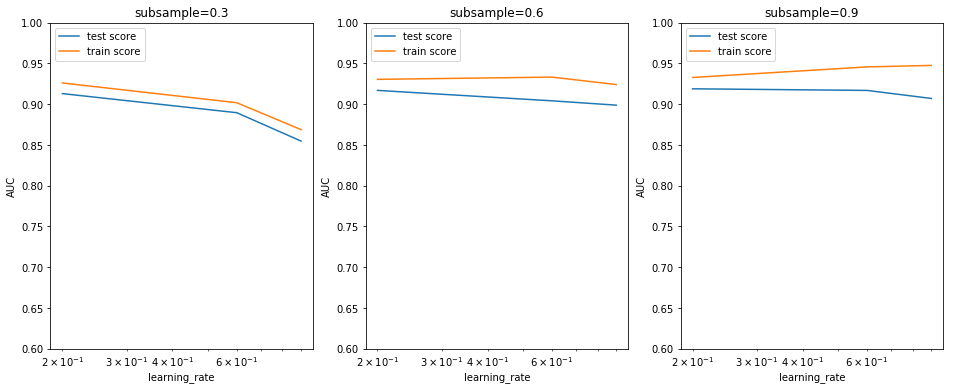

In [464]:
# # plotting
plt.figure(figsize=(16,6))


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

The results show that a subsample size of 0.9 and learning_rate of about 0.2 seems optimal. Also, GradientBoosting and Random Forest has resulted in the highest ROC AUC obtained (across various hyperparameters). 
Let's build a final model with the chosen hyperparameters.

2. Regularization techniques used for the model builing

Regularising the Decision Tree

In [465]:
reg_dt_model = DecisionTreeClassifier(criterion = 'entropy', max_depth = 7)
reg_dt_model.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=7,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [466]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                Imp
age        0.097795
job        0.042502
marital    0.016674
education  0.021516
default    0.001916
balance    0.093447
housing    0.030158
loan       0.006988
contact    0.039309
day        0.082288
month      0.093781
duration   0.309184
campaign   0.032027
pdays      0.075960
previous   0.010784
poutcome   0.045671


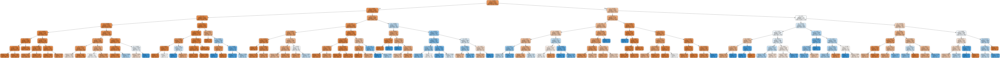

In [467]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()

export_graphviz(reg_dt_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [468]:
y_predict = reg_dt_model.predict(X_test)

In [469]:
reg_dt_model.score(X_test , y_test)

0.9017988793866116

In [470]:
print(metrics.confusion_matrix(y_test, y_predict))

[[11668   299]
 [ 1033   564]]


In [471]:
#Recall
print(564/(564+1033))

#Pression
print(564/(564+300))

#As per this analysis pression is better than Recall.

0.35316217908578584
0.6527777777777778
